In [ ]:
  # %cd /content/

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
# !unzip /content/drive/MyDrive/Colab\ Notebooks/MEDAI_DEC/archive.zip -d /content/

In [ ]:
# !pip install torchview

In [ ]:
%cd /content

/content


In [ ]:
cfg_path= "/content/lgg-mri-segmentation/kaggle_3m"

import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from torchsummary import summary
from torchview import draw_graph
import torch.optim.lr_scheduler as lr_scheduler

import matplotlib.pyplot as plt
from tqdm import tqdm
import glob
import numpy as np
import pandas as pd
import seaborn as sns
import albumentations as A
from albumentations.pytorch import ToTensorV2
import PIL
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_fscore_support, accuracy_score, f1_score, matthews_corrcoef


import random
from collections import defaultdict
import os
import shutil
import copy
from typing import Dict, List, Tuple
import graphviz


# /content/lgg-mri-segmentation/kaggle_3m/TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif

In [ ]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

BATCH_SIZE = (
        32 if torch.cuda.device_count() < 2
        else (32 * torch.cuda.device_count())
    )
seed =768
NUM_WORKERS = os.cpu_count()

LR = 1e-4
PATIENCE= 5
EPOCHS=100

NUM_DEVICES = torch.cuda.device_count()



In [ ]:
NUM_DEVICES

1

In [ ]:
# Fetching files from the directory
file_list= glob.glob(cfg_path+"/*/*.tif", recursive= True)

In [ ]:
len(file_list)

7858

In [ ]:
file_list[:5]

['/content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7300_19910814/TCGA_DU_7300_19910814_6.tif',
 '/content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7300_19910814/TCGA_DU_7300_19910814_17_mask.tif',
 '/content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7300_19910814/TCGA_DU_7300_19910814_5_mask.tif',
 '/content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7300_19910814/TCGA_DU_7300_19910814_29.tif',
 '/content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7300_19910814/TCGA_DU_7300_19910814_29_mask.tif']

In [ ]:
# ID sorting for each scan

fl_copy= file_list

In [ ]:
def get_sample_numbers(image_paths):
  sample_numbers= []
  is_mask= []
  for f in image_paths:
    path_list= f.split('/')[-2:][1].split('_')
    print(path_list)

    if 'mask.tif' in path_list:
      sample_numbers.append(int(path_list[-2]))
      is_mask.append(1)
      print(is_mask)
      print(sample_numbers)
    else:
      sample_numbers.append(int(path_list[-1].replace('.tif', '')))
      is_mask.append(0)

  return sample_numbers, is_mask

def get_sample_patient_id(image_paths):
  return [(id_.split('/')[-2:][0]) for id_ in image_paths]



In [ ]:
get_sample_numbers(file_list)

['TCGA', 'DU', '7300', '19910814', '6.tif']
['TCGA', 'DU', '7300', '19910814', '17', 'mask.tif']
[0, 1]
[6, 17]
['TCGA', 'DU', '7300', '19910814', '5', 'mask.tif']
[0, 1, 1]
[6, 17, 5]
['TCGA', 'DU', '7300', '19910814', '29.tif']
['TCGA', 'DU', '7300', '19910814', '29', 'mask.tif']
[0, 1, 1, 0, 1]
[6, 17, 5, 29, 29]
['TCGA', 'DU', '7300', '19910814', '27', 'mask.tif']
[0, 1, 1, 0, 1, 1]
[6, 17, 5, 29, 29, 27]
['TCGA', 'DU', '7300', '19910814', '25.tif']
['TCGA', 'DU', '7300', '19910814', '27.tif']
['TCGA', 'DU', '7300', '19910814', '10.tif']
['TCGA', 'DU', '7300', '19910814', '7', 'mask.tif']
[0, 1, 1, 0, 1, 1, 0, 0, 0, 1]
[6, 17, 5, 29, 29, 27, 25, 27, 10, 7]
['TCGA', 'DU', '7300', '19910814', '11', 'mask.tif']
[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1]
[6, 17, 5, 29, 29, 27, 25, 27, 10, 7, 11]
['TCGA', 'DU', '7300', '19910814', '21.tif']
['TCGA', 'DU', '7300', '19910814', '18', 'mask.tif']
[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1]
[6, 17, 5, 29, 29, 27, 25, 27, 10, 7, 11, 21, 18]
['TCGA', 'DU',

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['TCGA', 'DU', '7013', '19860523', '41.tif']
['TCGA', 'DU', '7013', '19860523', '22', 'mask.tif']
[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




[6, 17, 5, 29, 29, 27, 25, 27, 10, 7, 11, 21, 18, 26, 33, 23, 35, 5, 36, 19, 9, 16, 24, 30, 12, 12, 9, 14, 3, 33, 4, 22, 7, 10, 16, 36, 14, 8, 34, 13, 25, 2, 23, 31, 18, 8, 32, 15, 34, 11, 22, 1, 21, 32, 28, 20, 28, 4, 26, 17, 24, 20, 13, 1, 30, 2, 19, 15, 35, 31, 6, 3, 5, 7, 17, 17, 18, 11, 4, 10, 11, 9, 20, 4, 16, 8, 12, 3, 12, 10, 14, 13, 1, 2, 14, 18, 5, 19, 7, 9, 3, 8, 19, 6, 15, 6, 13, 15, 1, 16, 2, 20, 7, 31, 33, 20, 27, 29, 14, 1, 28, 4, 3, 2, 9, 34, 22, 30, 17, 23, 13, 32, 7, 14, 8, 35, 15, 25, 18, 24, 1, 28, 11, 11, 16, 20, 21, 27, 26, 30, 22, 6, 9, 8, 2, 18, 4, 5, 6, 24, 26, 35, 19, 15, 5, 21, 10, 32, 10, 23, 33, 3, 12, 17, 13, 25, 36, 29, 12, 31, 16, 19, 36, 34, 1, 11, 28, 27, 14, 32, 11, 28, 33, 38, 19, 8, 30, 15, 35, 16, 22, 29, 21, 31, 8, 36, 3, 10, 25, 22, 34, 30, 2, 21, 15, 19, 16, 9, 12, 2, 34, 31, 24, 18, 23, 10, 17, 9, 5, 32, 29, 7, 20, 26, 1, 26, 36, 6, 13, 4, 37, 27, 38, 14, 20, 24, 13, 18, 4, 33, 37, 3, 17, 7, 6, 23, 5, 35, 25, 12, 7, 14, 6, 11, 19, 6, 8, 17, 10

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



([6,
  17,
  5,
  29,
  29,
  27,
  25,
  27,
  10,
  7,
  11,
  21,
  18,
  26,
  33,
  23,
  35,
  5,
  36,
  19,
  9,
  16,
  24,
  30,
  12,
  12,
  9,
  14,
  3,
  33,
  4,
  22,
  7,
  10,
  16,
  36,
  14,
  8,
  34,
  13,
  25,
  2,
  23,
  31,
  18,
  8,
  32,
  15,
  34,
  11,
  22,
  1,
  21,
  32,
  28,
  20,
  28,
  4,
  26,
  17,
  24,
  20,
  13,
  1,
  30,
  2,
  19,
  15,
  35,
  31,
  6,
  3,
  5,
  7,
  17,
  17,
  18,
  11,
  4,
  10,
  11,
  9,
  20,
  4,
  16,
  8,
  12,
  3,
  12,
  10,
  14,
  13,
  1,
  2,
  14,
  18,
  5,
  19,
  7,
  9,
  3,
  8,
  19,
  6,
  15,
  6,
  13,
  15,
  1,
  16,
  2,
  20,
  7,
  31,
  33,
  20,
  27,
  29,
  14,
  1,
  28,
  4,
  3,
  2,
  9,
  34,
  22,
  30,
  17,
  23,
  13,
  32,
  7,
  14,
  8,
  35,
  15,
  25,
  18,
  24,
  1,
  28,
  11,
  11,
  16,
  20,
  21,
  27,
  26,
  30,
  22,
  6,
  9,
  8,
  2,
  18,
  4,
  5,
  6,
  24,
  26,
  35,
  19,
  15,
  5,
  21,
  10,
  32,
  10,
  23,
  33,
  3,
  12,
  17,
  13,
  25

In [ ]:
get_sample_patient_id(file_list)

['TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_7300_19910814',
 'TCGA_DU_73

In [ ]:
def build_df(image_paths):
  sample_numbers, mask_label= get_sample_numbers(image_paths)
  sample_df= pd.DataFrame({
      'id': sample_numbers ,
      'patient': get_sample_patient_id(image_paths),
      'image_path': image_paths,
      'is_mask': mask_label,

  })
  return sample_df

In [ ]:
dataset_df=(build_df(file_list).sort_values(by= ['id', 'patient', 'image_path']).reset_index(drop= True))

['TCGA', 'DU', '7300', '19910814', '6.tif']
['TCGA', 'DU', '7300', '19910814', '17', 'mask.tif']
[0, 1]
[6, 17]
['TCGA', 'DU', '7300', '19910814', '5', 'mask.tif']
[0, 1, 1]
[6, 17, 5]
['TCGA', 'DU', '7300', '19910814', '29.tif']
['TCGA', 'DU', '7300', '19910814', '29', 'mask.tif']
[0, 1, 1, 0, 1]
[6, 17, 5, 29, 29]
['TCGA', 'DU', '7300', '19910814', '27', 'mask.tif']
[0, 1, 1, 0, 1, 1]
[6, 17, 5, 29, 29, 27]
['TCGA', 'DU', '7300', '19910814', '25.tif']
['TCGA', 'DU', '7300', '19910814', '27.tif']
['TCGA', 'DU', '7300', '19910814', '10.tif']
['TCGA', 'DU', '7300', '19910814', '7', 'mask.tif']
[0, 1, 1, 0, 1, 1, 0, 0, 0, 1]
[6, 17, 5, 29, 29, 27, 25, 27, 10, 7]
['TCGA', 'DU', '7300', '19910814', '11', 'mask.tif']
[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1]
[6, 17, 5, 29, 29, 27, 25, 27, 10, 7, 11]
['TCGA', 'DU', '7300', '19910814', '21.tif']
['TCGA', 'DU', '7300', '19910814', '18', 'mask.tif']
[0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1]
[6, 17, 5, 29, 29, 27, 25, 27, 10, 7, 11, 21, 18]
['TCGA', 'DU',

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[6, 17, 5, 29, 29, 27, 25, 27, 10, 7, 11, 21, 18, 26, 33, 23, 35, 5, 36, 19, 9, 16, 24, 30, 12, 12, 9, 14, 3, 33, 4, 22, 7, 10, 16, 36, 14, 8, 34, 13, 25, 2, 23, 31, 18, 8, 32, 15, 34, 11, 22, 1, 21, 32, 28, 20, 28, 4, 26, 17, 24, 20, 13, 1, 30, 2, 19, 15, 35, 31, 6, 3, 5, 7, 17, 17, 18, 11, 4, 10, 11, 9, 20, 4, 16, 8, 12, 3, 12, 10, 14, 13, 1, 2, 14, 18, 5, 19, 7, 9, 3, 8, 19, 6, 15, 6, 13, 15, 1, 16, 2, 20, 7, 31, 33, 20, 27, 29, 14, 1, 28, 4, 3, 2, 9, 34, 22, 30, 17, 23, 13, 32, 7, 14, 8, 35, 15, 25, 18, 24, 1, 28, 11, 11, 16, 20, 21, 27, 26, 30, 22, 6, 9, 8, 2, 18, 4, 5, 6, 24, 26, 35, 19, 15, 5, 21, 10, 32, 10, 23, 33, 3, 12, 17, 13, 25, 36, 29, 12, 31, 16, 19, 36, 34, 1, 11, 28, 27, 14, 32, 11, 28, 33, 38, 19, 8, 30, 15, 35, 16, 22, 29, 21, 31, 8, 36, 3, 10, 25, 22, 34, 30, 2, 21, 15, 19, 16, 9, 12, 2, 34, 31, 24, 18, 23, 10, 17, 9, 5, 32, 29, 7, 20, 26, 1, 26, 36, 6, 13, 4, 37, 27, 38, 14, 20, 24, 13, 18, 4, 33, 37, 3, 17, 7, 6, 23, 5, 35, 25, 12, 7, 14, 6, 11, 19, 6, 8, 17, 10,

In [ ]:
dataset_df.head()

,id,patient,image_path,is_mask
0,1,TCGA_CS_4941_19960909,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
1,1,TCGA_CS_4941_19960909,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,1
2,1,TCGA_CS_4942_19970222,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
3,1,TCGA_CS_4942_19970222,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,1
4,1,TCGA_CS_4943_20000902,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0


In [ ]:
#Group Samples by mask status

grouped_df= dataset_df.groupby(by= 'is_mask')

image_df, mask_df= (grouped_df.get_group(0).drop('is_mask', axis= 1).reset_index(drop=True),
                    grouped_df.get_group(1).drop('is_mask', axis= 1).reset_index(drop=True)
)



In [ ]:
mask_df= mask_df.rename({'image_path' : 'mask_path'}, axis=1)

In [ ]:
mask_df

,id,patient,mask_path
0,1,TCGA_CS_4941_19960909,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
1,1,TCGA_CS_4942_19970222,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
2,1,TCGA_CS_4943_20000902,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
3,1,TCGA_CS_4944_20010208,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
4,1,TCGA_CS_5393_19990606,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
...,...,...,...
3924,86,TCGA_HT_A61B_19991127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3925,87,TCGA_HT_A61A_20000127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3926,87,TCGA_HT_A61B_19991127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3927,88,TCGA_HT_A61A_20000127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...


In [ ]:
def _load(image_path, as_tensor= True):
  image=Image.open(image_path)
  image= np.array(image).astype(np.float32) / 255.
  return image

def generate_label(mask_path, load_fn):
  mask= load_fn(mask_path)
  if mask.max() > 0:
    return 1
  return 0

In [ ]:
ds= image_df.merge(mask_df, on=['id', 'patient'], how='left')



In [ ]:
ds

,id,patient,image_path,mask_path
0,1,TCGA_CS_4941_19960909,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
1,1,TCGA_CS_4942_19970222,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
2,1,TCGA_CS_4943_20000902,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
3,1,TCGA_CS_4944_20010208,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
4,1,TCGA_CS_5393_19990606,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...
...,...,...,...,...
3924,86,TCGA_HT_A61B_19991127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3925,87,TCGA_HT_A61A_20000127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3926,87,TCGA_HT_A61B_19991127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...
3927,88,TCGA_HT_A61A_20000127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...


In [ ]:
ds['diagnosis'] = [generate_label(_, _load) for _ in tqdm(ds['mask_path'])]

100%|██████████| 3929/3929 [00:05<00:00, 696.58it/s]


In [ ]:
ds

,id,patient,image_path,mask_path,diagnosis
0,1,TCGA_CS_4941_19960909,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
1,1,TCGA_CS_4942_19970222,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
2,1,TCGA_CS_4943_20000902,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
3,1,TCGA_CS_4944_20010208,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
4,1,TCGA_CS_5393_19990606,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_C...,0
...,...,...,...,...,...
3924,86,TCGA_HT_A61B_19991127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0
3925,87,TCGA_HT_A61A_20000127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0
3926,87,TCGA_HT_A61B_19991127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0
3927,88,TCGA_HT_A61A_20000127,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0


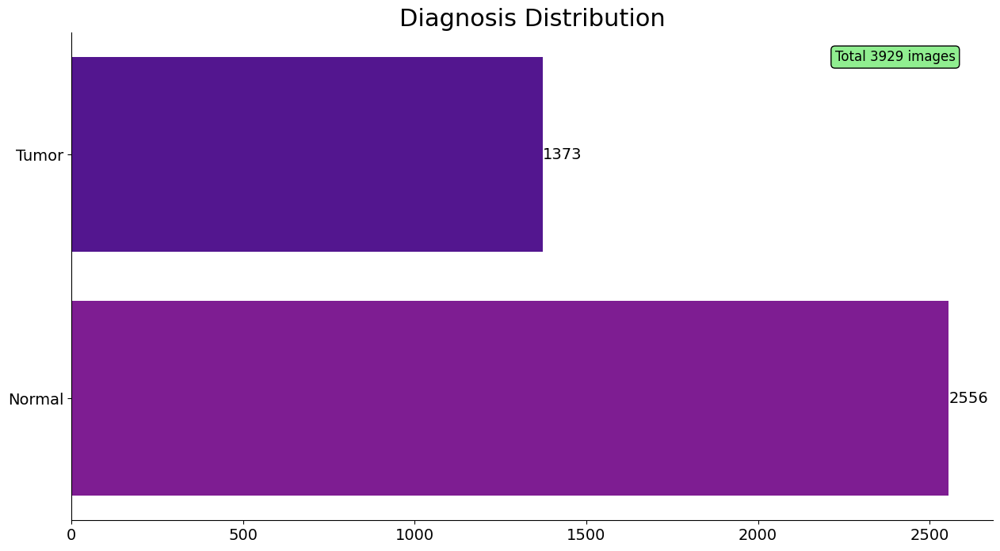

In [ ]:
# To View Diagnosis Distribution

fig= plt.figure(figsize= (15,8))

plt.title("Diagnosis Distribution", fontsize= 22)

diagnosis_distribution =ds['diagnosis'].value_counts().sort_values()
diagnosis_map = {0 : 'Normal', 1 : 'Tumor'}

bar_plot= sns.barplot(
    x= diagnosis_distribution.values,
    y= [diagnosis_map[_] for _ in diagnosis_distribution.keys()],
    palette= sns.color_palette("plasma"),
    orient= 'h'
)

for container in bar_plot.containers:
  bar_plot.bar_label(container, fmt= '%.0f', fontsize= 14)

plt.xticks(fontsize= 14)
plt.yticks(fontsize= 14)

text_params= {
    'x' : 2400,
    'y' : -0.4,
    's' : f"Total {len(ds)} images",
    'size' : 12,
    'color' : "Black",
    'ha'    : "center",
    'va'    : "center",
    'bbox'  : dict(boxstyle= "round", fc= ("lightgreen"), ec= ("black"))

}
plt.text(**text_params)

sns.despine()




diagnosi_map= [_ for _ in diagnosis_distribution.keys()]


In [ ]:
def view_sample(image, mask, color_map= 'rgb', fig_size= (16,8), title_size= 18):
  plt.figure(figsize= fig_size);
  plt.tight_layout();
  plt.subplots_adjust(top= 0.95);

  plt.subplot(1,3, 1);
  plt.title("MRI", fontsize= title_size);
  if color_map == "rgb":
    plt.imshow(image);
  else:
    plt.imshow(image, cmap= color_map);

  plt.subplot(1, 3, 2);
  plt.title("Mask", fontsize= title_size);
  plt.imshow(mask, cmap= "gray");

  plt.subplot(1, 3, 3);
  plt.title("MRI + Mask", fontsize= title_size);

  if color_map == "rgb":
    plt.imshow(image)
  else:
    plt.imshow(image, cmap= color_map)

  plt.imshow(mask, cmap="gray", alpha= 0.5);

  return








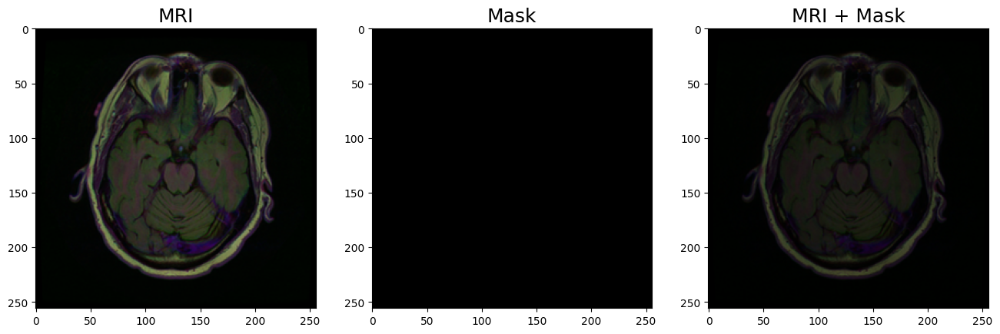

In [ ]:
rd_num= random.sample(ds.index.to_list(), 1)[0]

sample_image, sample_mask= _load(ds.image_path[rd_num]),  _load(ds.mask_path[rd_num])

view_sample(sample_image, sample_mask, color_map= 'mako')

In [ ]:
def view_multiple_sample(df, sample_loader, count= 10, color_map= "rgb", fig_size= (14, 10) ,title_size= 18):

  rd_num= random.sample(df.index.to_list(), count)

  plt.figure(figsize= fig_size);
  plt.tight_layout();
  plt.subplots_adjust(top= 0.95)

  for x, y in enumerate(rd_num):
    image, mask= (
        sample_loader(df.image_path[y]),
        sample_loader(df.mask_path[y])
  )

    idx= 3 * (x+1)

    plt.subplot(count+1, 3, idx+1);
    plt.title("MRI", fontsize= title_size);
    if color_map== "rgb":
      plt.imshow(image);
    else:
      plt.imshow(image, cmap= color_map);

    plt.subplot(count+1, 3, idx+2);
    plt.title("Mask", fontsize= title_size);
    plt.imshow(mask, cmap= "gray")

    plt.subplot(count+1, 3, idx+3)
    plt.title("MRI + MASK", fontsize= title_size)
    if color_map== "rgb":
      plt.imshow(image)
    else:
      plt.imshow(image, cmap= color_map)
    plt.imshow(mask, cmap ="gray", alpha= 0.5)

  return




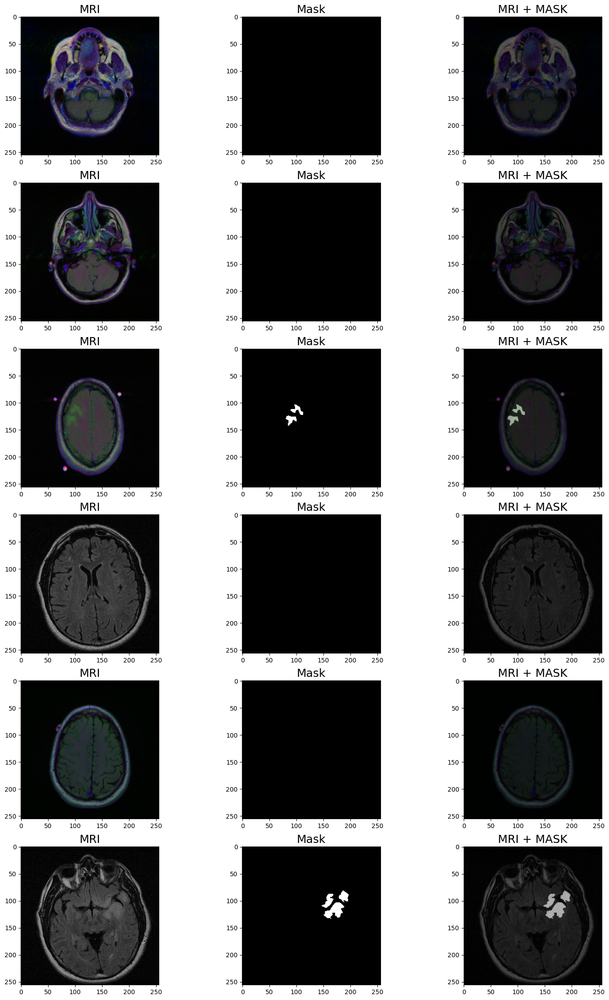

In [ ]:
view_multiple_sample(ds, _load, count=6, color_map = "mako", fig_size= (18, 30)  )


In [ ]:
# Splitting the dataset for training


train_split_idx, data_split_idx, _, _= train_test_split(ds.index, ds.diagnosis, test_size= 0.30, stratify= ds.diagnosis, random_state= seed)

In [ ]:
train_df= ds.iloc[train_split_idx].reset_index(drop=True)
data_df= ds.iloc[data_split_idx].reset_index(drop=True)

In [ ]:
print(train_df.shape)
print(data_df.shape)

(2750, 5)
(1179, 5)


In [ ]:
val_split_idx, test_split_idx, _, _ = train_test_split(data_df.index, data_df.diagnosis, test_size= 0.65, stratify = data_df.diagnosis, random_state= seed )

In [ ]:
val_df= data_df.iloc[val_split_idx].reset_index(drop= True)
test_df= data_df.iloc[test_split_idx].reset_index(drop= True)

In [ ]:
print(val_df.shape)
print(test_df.shape)

(412, 5)
(767, 5)


In [ ]:
train_size= len(train_df)
test_size= len(test_df)
val_size= len(val_df)
total_size= train_size + test_size + val_size

print("===================================================")
print(f'Training Sample Size:\t\t{train_size}\t({(100 * train_size/total_size):.2f}%)')
print(f'Testing Sample Size:\t\t{test_size}\t({(100 * test_size/total_size):.2f}%)')
print(f'Validation Sample Size:\t\t{val_size}\t({(100 * val_size/total_size):.2f}%)')
print("===================================================")

print(f'Total \t\t\t\t{total_size}\t({(100 * total_size/total_size):.2f}%)')


Training Sample Size:		2750	(69.99%)
Testing Sample Size:		767	(19.52%)
Validation Sample Size:		412	(10.49%)
Total 				3929	(100.00%)


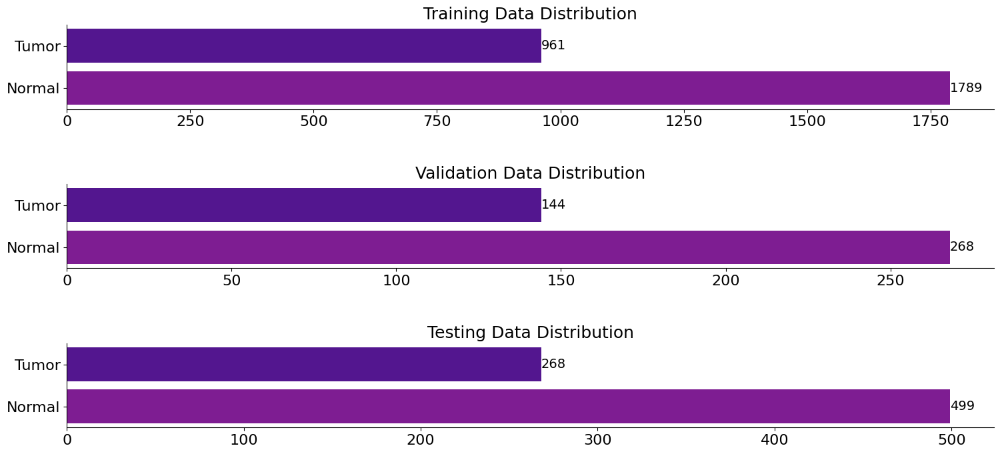

In [ ]:
fig, (ax1, ax2, ax3)= plt.subplots(3, figsize= (16, 8))
fig.tight_layout(pad= 6.0)

sns.despine()

#Train distribution
ax1.set_title("Training Data Distribution", fontsize= 18)
train_distribution= train_df['diagnosis'].value_counts().sort_values()
distribution_map = {0: 'Normal', 1 : 'Tumor'}

bar_plot= sns.barplot(
    x= train_distribution.values,
    y= [distribution_map[_] for _ in train_distribution.keys()],
    orient= 'h', palette= sns.color_palette('plasma'),
    ax= ax1

);

for container in bar_plot.containers:
  bar_plot.bar_label(container, fmt='%.0f', fontsize= 14);

# Axis tick parameters
ax1.tick_params(axis= 'both', which= 'major', labelsize= 16);

#Validation data distribution
ax2.set_title("Validation Data Distribution", fontsize= 18)
val_distribution= val_df['diagnosis'].value_counts().sort_values()

bar_plot= sns.barplot(
    x= val_distribution.values,
    y= [distribution_map[_] for _ in val_distribution.keys()],
    orient= 'h', palette= sns.color_palette('plasma'),
    ax= ax2

)
for container in bar_plot.containers:
  bar_plot.bar_label(container, fmt= '%.0f', fontsize= 14)

# Axis tick parameters
ax2.tick_params(axis= 'both', which= 'major', labelsize=16);

#Test data distribution
ax3.set_title("Testing Data Distribution", fontsize= 18)
test_distribution= test_df['diagnosis'].value_counts().sort_values()

bar_plot= sns.barplot(
    x= test_distribution.values,
    y= [distribution_map[_] for _ in test_distribution.keys()],
    orient= 'h', palette= sns.color_palette('plasma'),
    ax= ax3

)

for container in bar_plot.containers:
  bar_plot.bar_label(container, fmt= '%.0f', fontsize= 14 )

#axis Parameters
ax3.tick_params(axis= 'both', which= 'major', labelsize= 16)






In [ ]:

#Augment train data
train_transforms= A.Compose([
    A.Resize(224, 224, p=1.0),
    A.RandomBrightnessContrast(p=0.2),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    ToTensorV2(),
])

# Reshape Inference data

inference_transforms= A.Compose([
    A.Resize(224, 224, p=1.0),
    ToTensorV2(),
])


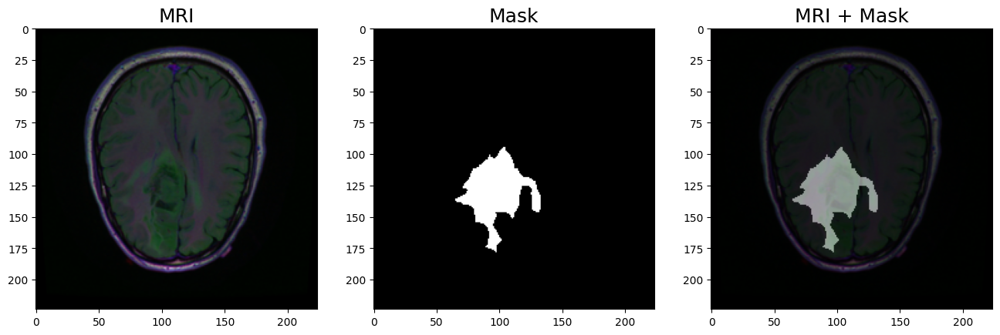

In [ ]:
# Select random sample from train_df
idx= random.sample(train_df.index.to_list(), 1)[0]

# Load the random sample and label
sample_image, sample_label= _load(train_df.image_path[idx]), _load(train_df.mask_path[idx])

aug= train_transforms(image= sample_image, mask= sample_label)

# View the random sample
view_sample(image= aug['image'].permute(1,2,0), mask= aug['mask'].unsqueeze_(0).permute(1,2,0), color_map= 'mako')


In [ ]:
class MRISegmentationDataset(Dataset):
  def __init__(self, df:pd.DataFrame, transform= None) -> None:
    super().__init__()

    self.mri_paths= df['image_path'].to_list()
    self.mask_paths= df['mask_path'].to_list()

    self.transform= transform

  def load_sample(self, index:str) -> Image.Image:
    image_path= self.mri_paths[index]
    mask_path= self.mask_paths[index]

    image= Image.open(image_path)
    mask= Image.open(mask_path)

    image= np.array(image).astype(np.float32) /255.
    mask= np.array(mask).astype(np.float32) /255.


    return image, mask

  def __len__(self) -> int:
    return self.mri_paths.__len__()

  def __getitem__(self, index:int) -> Tuple[torch.Tensor, torch.Tensor]:
    image,mask = self.load_sample(index)

    if self.transform:
      transformed= self.transform(image= image, mask= mask)
      return transformed['image'], transformed['mask'].unsqueeze_(0)
    else:
      transformed= ToTensorV2()(image= image, mask=mask)
      return transformed['image'], transformed['mask'].unsqueeze_(0)








In [ ]:
#Building Datasets
train_ds= MRISegmentationDataset(train_df, transform= train_transforms)

val_ds= MRISegmentationDataset(val_df, transform= inference_transforms)

test_ds= MRISegmentationDataset(test_df, transform= inference_transforms)


In [ ]:
#Building Dataloaders



train_dl= DataLoader(dataset= train_ds,
                     batch_size= BATCH_SIZE ,
                     num_workers= NUM_WORKERS ,
                     shuffle= True )

val_dl= DataLoader(dataset= val_ds,
                   batch_size= BATCH_SIZE,
                   num_workers= NUM_WORKERS,
                   shuffle= False
                   )
test_dl = DataLoader(dataset= test_ds,
                     batch_size= BATCH_SIZE,
                     num_workers= NUM_WORKERS,
                     shuffle= False
)


In [ ]:
#Training Function

def execute_epoch(model:torch.nn.Module,dataloader:torch.utils.data.DataLoader,
                  optimizer:torch.optim.Optimizer,
                  loss_fn:torch.nn.Module,
                  device:torch.device) -> Tuple[float, float]:

  model.train()

  train_loss, train_dice = 0,0

  for batch, (X, y) in enumerate(tqdm(dataloader)):
    #Loading Data onto target device
    X= X.to(device)
    y= y.to(device)


    # prediction and loss
    y_pred= model(X)
    loss= loss_fn(y_pred, y)
    train_loss += loss.detach().cpu()

    #Gradients resetting and loss backpropagation
    optimizer.zero_grad()
    loss.backward()

    #Update model gradients
    optimizer.step()

    #Compute batchwise Metrics
    prediction= torch.sigmoid(y_pred)
    predicted_class= (prediction>0.5).float()

    eps= 1e-8
    train_dice += (
              (2 * (y * predicted_class).sum() + eps)/
              ((y+predicted_class).sum() + eps)
        ).detach().cpu()
  train_loss= train_loss / len(dataloader)
  train_dice= train_dice / len(dataloader)

  return train_loss, train_dice



In [ ]:
def evaluate(
    model:torch.nn.Module,
    dataloader:torch.utils.data.DataLoader,
    loss_fn: torch.nn.Module,
    device:torch.device
) -> Tuple[float, float]:

  model.eval()

  #Initialize eval loss & accuracy
  eval_loss, eval_dice= 0,  0

  with torch.inference_mode():

    for batch, (X, y) in enumerate(dataloader):

      X= X.to(device)
      y= y.to(device)

      # Training and feel forward
      y_pred= model(X)
      loss= loss_fn(y_pred, y)
      eval_loss += loss.detach().cpu().numpy()

      #Evaluation Metrics

      prediction=torch.sigmoid(y_pred)
      predicted_class= (prediction > 0.5).float()

      eps= 1e-8

      eval_dice += (
          ( 2 * (y * predicted_class).sum() + eps)/
          ((y + predicted_class).sum() +eps)
          ).detach().cpu()

  eval_loss= eval_loss / len(dataloader)
  eval_dice= eval_dice / len(dataloader)

  return eval_loss, eval_dice









In [ ]:
# Training loop

def train(
    model: torch.nn.Module,
    train_dataloader: torch.utils.data.DataLoader,
    eval_dataloader : torch.utils.data.DataLoader,
    optimizer:torch.optim.Optimizer,
    loss_fn: torch.nn.Module,
    scheduler: torch.optim.lr_scheduler,
    epochs: int,
    device: torch.device) -> Dict[str, List]:

  session={
      'loss' : [],
      'loss_score' : [],
      'eval_loss': [],
      'eval_score': []
  }

  for epoch in tqdm(range(epochs)):

    print(f'Training Model \n Epoch {epoch +1} / {epochs}')
    train_loss, train_dice= execute_epoch(
        model,
        train_dataloader,
        optimizer,
        loss_fn,
        device

    )

    eval_loss, eval_dice= evaluate(
        model,
        eval_dataloader,
        loss_fn,
        device
    )

    current_lr = 0
    if scheduler:
      scheduler.step(eval_loss)
      current_lr= optimizer.param_groups[0]['lr']

    # Logging epoch Metrics
    log_text= f'loss: {train_loss:.4f} - dice_score: {train_dice:.4f} - eval_loss: {eval_loss:.4f} - eval_dice: {eval_dice:.4f}'

    if scheduler:
      print(log_text + f' lr : {current_lr}')
    else:
      print(log_text)

    #Record Epoch Metrics
    session['loss'].append(train_loss)
    session['loss_score'].append(train_dice)
    session['eval_loss'].append(eval_loss)
    session['eval_score'].append(eval_dice)


  return session








In [ ]:
def predict(
    model:torch.nn.Module,
    sample_loader:torch.utils.data.DataLoader,
    device:torch.device,
    threshold:float=0.5,
) -> np.ndarray:

  #Setting model to evaluation mode
  model.eval()

  predictions= []
  with torch.inference_mode():
    for batch, (X,y) in enumerate(tqdm(sample_loader)):
      X= X.to(device)
      y= y.to(device)

      y_pred= model(X)

      prediction= torch.sigmoid(y_pred)
      predicted_class= (prediction >= threshold).float()

      predictions.append(predicted_class.cpu().numpy())



  return np.vstack(predictions)

In [ ]:

# graphviz.set_jupyter_format('png')

# model_graph= draw_graph(
#     Unet_Model(),
#     input_size= (1, 3, 224, 224 ),
#      roll= True, expand_nested= True
# )

# model_graph.visual_graph

In [ ]:
class Squeeze_Excite(nn.Module):
  def __init__(self, channel, reduction):
    super().__init__()
    self.avg_pool= nn.AdaptiveAvgPool2d(1)
    self.fc= nn.Sequential(
        nn.Linear(channel, channel // reduction, bias= False),
        nn.PReLU(),
        nn.Linear(channel // reduction, channel, bias= False),
        nn.Sigmoid()
    )
  def forward(self, x):
    b, c, _, _ = x.size()
    out= self.avg_pool(x).view(b,c)
    out= self.fc(out).view(b, c, 1, 1)
    return x * out.expand_as(x)


In [ ]:
class VGGBlock(nn.Module):

  def __init__(self, in_channels, mid_channels, out_channels ):
    super().__init__()
    self.relu= nn.PReLU()
    self.conv1= nn.Conv2d(in_channels, mid_channels, 3, padding= 1)
    self.bn1= nn.BatchNorm2d(mid_channels)
    self.conv2= nn.Conv2d(mid_channels, out_channels, 3, padding=1)
    self.bn2= nn.BatchNorm2d(out_channels)
    self.SE= Squeeze_Excite(out_channels, 8)


  def forward(self, x):
    out= self.conv1(x)
    out= self.bn1(out)
    out= self.relu(out)

    out=self.conv2(out)
    out= self.bn2(out)
    out= self.relu(out)
    out= self.SE(out)


    return out

In [ ]:
# UNET with Squeeze and Excitation - Model 2
class UNET(nn.Module):
  def __init__(self, num_classes = 3, input_channels= 3):
    super().__init__()

    block_size= [32, 64, 128, 256, 512 ]

    self.pool= nn.MaxPool2d(2, 2)
    self.up= nn.Upsample(scale_factor= 2, mode= 'bilinear', align_corners= True)

    self.vgg0_0= VGGBlock(input_channels, block_size[0], block_size[0])
    self.vgg0_1= VGGBlock(block_size[0], block_size[1], block_size[1])
    self.vgg1_2= VGGBlock(block_size[1], block_size[2], block_size[2])
    self.vgg2_3= VGGBlock(block_size[2], block_size[3], block_size[3])
    self.vgg3_4= VGGBlock(block_size[3], block_size[4], block_size[4])

    self.vgg7_3= VGGBlock(block_size[3]+block_size[4], block_size[3], block_size[3])
    self.vgg5_2= VGGBlock(block_size[3]+block_size[2], block_size[2], block_size[2])
    self.vgg3_1= VGGBlock(block_size[2]+block_size[1], block_size[1], block_size[1])
    self.vgg1_0= VGGBlock(block_size[1]+block_size[0], block_size[0], block_size[0])

    self.final= nn.Conv2d(block_size[0], num_classes, kernel_size= 1)

  def forward(self, x):
    out0_0= self.vgg0_0(x)
    out0_1= self.vgg0_1(self.pool(out0_0))
    out1_2= self.vgg1_2(self.pool(out0_1))
    out2_3= self.vgg2_3(self.pool(out1_2))
    out3_4= self.vgg3_4(self.pool(out2_3))

    out7_3= self.vgg7_3(torch.cat([out2_3, self.up(out3_4)], 1))
    out5_2= self.vgg5_2(torch.cat([out1_2, self.up(out7_3)], 1))
    out3_1= self.vgg3_1(torch.cat([out0_1, self.up(out5_2)], 1))
    out1_0= self.vgg1_0(torch.cat([out0_0, self.up(out3_1)], 1))

    output= self.final(out1_0)
    return output

In [ ]:
n_model= UNET(num_classes=1).to(DEVICE)

if NUM_DEVICES > 1:
  unet_model = nn.DataParallel(n_model)

# x= torch.randn(1, 3, 224, 224)
# n_model(x)

In [ ]:
summary(n_model, input_size=(3, 224, 224), batch_size= BATCH_SIZE)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [32, 32, 224, 224]             896
       BatchNorm2d-2         [32, 32, 224, 224]              64
             PReLU-3         [32, 32, 224, 224]               1
            Conv2d-4         [32, 32, 224, 224]           9,248
       BatchNorm2d-5         [32, 32, 224, 224]              64
             PReLU-6         [32, 32, 224, 224]               1
 AdaptiveAvgPool2d-7             [32, 32, 1, 1]               0
            Linear-8                    [32, 4]             128
             PReLU-9                    [32, 4]               1
           Linear-10                   [32, 32]             128
          Sigmoid-11                   [32, 32]               0
   Squeeze_Excite-12         [32, 32, 224, 224]               0
         VGGBlock-13         [32, 32, 224, 224]               0
        MaxPool2d-14         [32, 32, 1

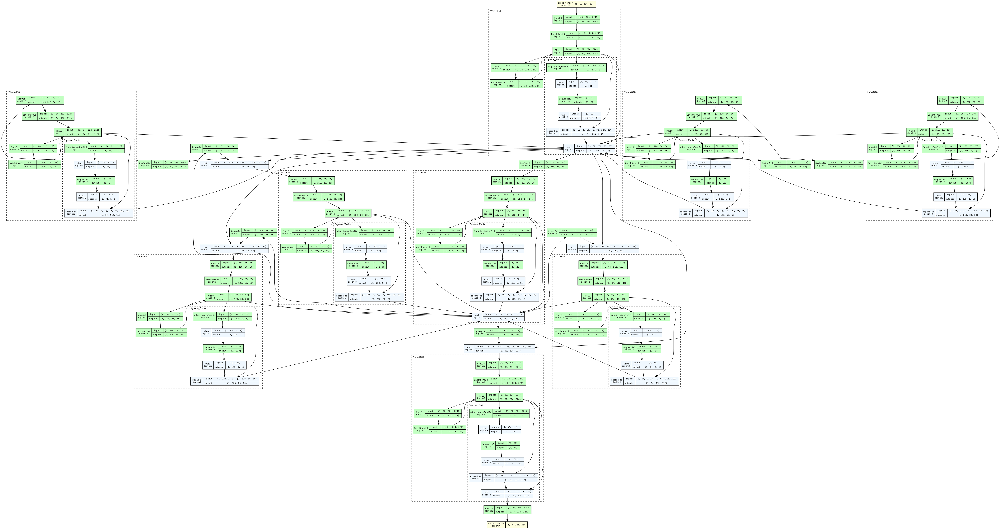

In [ ]:
graphviz.set_jupyter_format('png')

model_graph= draw_graph(
    UNET(),
    input_size= (1, 3, 224, 224 ),
     roll= True, expand_nested= True
)

model_graph.visual_graph

In [ ]:


#Define Loss Function
loss_fn =nn.BCEWithLogitsLoss()

#Define Optimizer
optimizer= torch.optim.AdamW(
    n_model.parameters(),
    lr=  LR
)

scheduler= lr_scheduler.ReduceLROnPlateau(

            optimizer=optimizer,
            mode= 'min',
            patience= PATIENCE,
            verbose= True

)

In [ ]:


print('Training U-Net Model')
print(f'Train on {len(train_df)} samples, validation on {len(val_df)} samples')
print("------------------------------------------")

#Generate Training Session Config

session_config={
    'model' : n_model,
    'train_dataloader' : train_dl,
    'eval_dataloader' : val_dl,
    'optimizer' : optimizer,
    'scheduler' : scheduler,
    'loss_fn' : loss_fn,
    'epochs' : EPOCHS,
    'device' : DEVICE


}

unet_session_history= train(**session_config)

Training U-Net Model
Train on 2750 samples, validation on 412 samples
------------------------------------------


  0%|          | 0/100 [00:00<?, ?it/s]

Training Model 
 Epoch 1 / 100



  1%|          | 1/100 [00:54<1:29:20, 54.15s/it]

loss: 0.5752 - dice_score: 0.3892 - eval_loss: 0.5433 - eval_dice: 0.5916 lr : 0.0001
Training Model 
 Epoch 2 / 100



  2%|▏         | 2/100 [01:50<1:30:14, 55.25s/it]

loss: 0.5259 - dice_score: 0.5752 - eval_loss: 0.5159 - eval_dice: 0.6587 lr : 0.0001
Training Model 
 Epoch 3 / 100



  3%|▎         | 3/100 [02:50<1:32:55, 57.48s/it]

loss: 0.5057 - dice_score: 0.5601 - eval_loss: 0.5056 - eval_dice: 0.5854 lr : 0.0001
Training Model 
 Epoch 4 / 100



  4%|▍         | 4/100 [03:48<1:32:25, 57.77s/it]

loss: 0.4802 - dice_score: 0.6197 - eval_loss: 0.4617 - eval_dice: 0.6977 lr : 0.0001
Training Model 
 Epoch 5 / 100



  5%|▌         | 5/100 [04:47<1:32:16, 58.28s/it]

loss: 0.4556 - dice_score: 0.6528 - eval_loss: 0.4613 - eval_dice: 0.5768 lr : 0.0001
Training Model 
 Epoch 6 / 100



  6%|▌         | 6/100 [05:44<1:30:37, 57.84s/it]

loss: 0.4288 - dice_score: 0.6632 - eval_loss: 0.4158 - eval_dice: 0.6916 lr : 0.0001
Training Model 
 Epoch 7 / 100



  7%|▋         | 7/100 [06:41<1:28:53, 57.35s/it]

loss: 0.3996 - dice_score: 0.6841 - eval_loss: 0.3895 - eval_dice: 0.7098 lr : 0.0001
Training Model 
 Epoch 8 / 100



  8%|▊         | 8/100 [07:36<1:27:15, 56.91s/it]

loss: 0.3724 - dice_score: 0.6526 - eval_loss: 0.3547 - eval_dice: 0.6295 lr : 0.0001
Training Model 
 Epoch 9 / 100



  9%|▉         | 9/100 [08:33<1:25:53, 56.64s/it]

loss: 0.3429 - dice_score: 0.6611 - eval_loss: 0.3136 - eval_dice: 0.6919 lr : 0.0001
Training Model 
 Epoch 10 / 100



 10%|█         | 10/100 [09:28<1:24:27, 56.30s/it]

loss: 0.3151 - dice_score: 0.6341 - eval_loss: 0.3100 - eval_dice: 0.6439 lr : 0.0001
Training Model 
 Epoch 11 / 100



 11%|█         | 11/100 [10:24<1:23:19, 56.17s/it]

loss: 0.2853 - dice_score: 0.6260 - eval_loss: 0.2485 - eval_dice: 0.6716 lr : 0.0001
Training Model 
 Epoch 12 / 100



 12%|█▏        | 12/100 [11:21<1:22:57, 56.57s/it]

loss: 0.2557 - dice_score: 0.6086 - eval_loss: 0.2392 - eval_dice: 0.6835 lr : 0.0001
Training Model 
 Epoch 13 / 100



 13%|█▎        | 13/100 [12:17<1:21:35, 56.27s/it]

loss: 0.2290 - dice_score: 0.6429 - eval_loss: 0.2092 - eval_dice: 0.4171 lr : 0.0001
Training Model 
 Epoch 14 / 100



 14%|█▍        | 14/100 [13:15<1:21:19, 56.73s/it]

loss: 0.1975 - dice_score: 0.6240 - eval_loss: 0.1860 - eval_dice: 0.6096 lr : 0.0001
Training Model 
 Epoch 15 / 100



 15%|█▌        | 15/100 [14:12<1:20:29, 56.81s/it]

loss: 0.1760 - dice_score: 0.5840 - eval_loss: 0.1628 - eval_dice: 0.6914 lr : 0.0001
Training Model 
 Epoch 16 / 100



 16%|█▌        | 16/100 [15:08<1:19:25, 56.73s/it]

loss: 0.1556 - dice_score: 0.5969 - eval_loss: 0.1441 - eval_dice: 0.6547 lr : 0.0001
Training Model 
 Epoch 17 / 100



 17%|█▋        | 17/100 [16:06<1:18:48, 56.97s/it]

loss: 0.1378 - dice_score: 0.6177 - eval_loss: 0.1303 - eval_dice: 0.6788 lr : 0.0001
Training Model 
 Epoch 18 / 100



 18%|█▊        | 18/100 [17:05<1:18:51, 57.70s/it]

loss: 0.1220 - dice_score: 0.6488 - eval_loss: 0.1114 - eval_dice: 0.6733 lr : 0.0001
Training Model 
 Epoch 19 / 100



 19%|█▉        | 19/100 [18:03<1:18:05, 57.84s/it]

loss: 0.1095 - dice_score: 0.6421 - eval_loss: 0.1156 - eval_dice: 0.5904 lr : 0.0001
Training Model 
 Epoch 20 / 100



 20%|██        | 20/100 [19:03<1:17:37, 58.21s/it]

loss: 0.0995 - dice_score: 0.6116 - eval_loss: 0.0937 - eval_dice: 0.6509 lr : 0.0001
Training Model 
 Epoch 21 / 100



 21%|██        | 21/100 [19:59<1:15:58, 57.71s/it]

loss: 0.0889 - dice_score: 0.6461 - eval_loss: 0.0840 - eval_dice: 0.6963 lr : 0.0001
Training Model 
 Epoch 22 / 100



 22%|██▏       | 22/100 [20:55<1:14:23, 57.22s/it]

loss: 0.0806 - dice_score: 0.6639 - eval_loss: 0.0754 - eval_dice: 0.6091 lr : 0.0001
Training Model 
 Epoch 23 / 100



 23%|██▎       | 23/100 [21:52<1:13:14, 57.07s/it]

loss: 0.0732 - dice_score: 0.6734 - eval_loss: 0.0681 - eval_dice: 0.7096 lr : 0.0001
Training Model 
 Epoch 24 / 100



 24%|██▍       | 24/100 [22:48<1:11:52, 56.74s/it]

loss: 0.0669 - dice_score: 0.6823 - eval_loss: 0.0634 - eval_dice: 0.6987 lr : 0.0001
Training Model 
 Epoch 25 / 100



 25%|██▌       | 25/100 [23:44<1:10:38, 56.51s/it]

loss: 0.0628 - dice_score: 0.6775 - eval_loss: 0.0592 - eval_dice: 0.7139 lr : 0.0001
Training Model 
 Epoch 26 / 100



 26%|██▌       | 26/100 [24:40<1:09:26, 56.31s/it]

loss: 0.0572 - dice_score: 0.6856 - eval_loss: 0.0532 - eval_dice: 0.7249 lr : 0.0001
Training Model 
 Epoch 27 / 100



 27%|██▋       | 27/100 [25:37<1:08:45, 56.51s/it]

loss: 0.0529 - dice_score: 0.6826 - eval_loss: 0.0492 - eval_dice: 0.7372 lr : 0.0001
Training Model 
 Epoch 28 / 100



 28%|██▊       | 28/100 [26:33<1:07:39, 56.39s/it]

loss: 0.0483 - dice_score: 0.7161 - eval_loss: 0.0464 - eval_dice: 0.7369 lr : 0.0001
Training Model 
 Epoch 29 / 100



 29%|██▉       | 29/100 [27:28<1:06:29, 56.19s/it]

loss: 0.0454 - dice_score: 0.7077 - eval_loss: 0.0429 - eval_dice: 0.7457 lr : 0.0001
Training Model 
 Epoch 30 / 100



 30%|███       | 30/100 [28:25<1:05:39, 56.28s/it]

loss: 0.0418 - dice_score: 0.7287 - eval_loss: 0.0392 - eval_dice: 0.7151 lr : 0.0001
Training Model 
 Epoch 31 / 100



 31%|███       | 31/100 [29:21<1:04:34, 56.15s/it]

loss: 0.0392 - dice_score: 0.7299 - eval_loss: 0.0363 - eval_dice: 0.7607 lr : 0.0001
Training Model 
 Epoch 32 / 100



 32%|███▏      | 32/100 [30:17<1:03:35, 56.11s/it]

loss: 0.0366 - dice_score: 0.7269 - eval_loss: 0.0336 - eval_dice: 0.7763 lr : 0.0001
Training Model 
 Epoch 33 / 100



 33%|███▎      | 33/100 [31:13<1:02:36, 56.06s/it]

loss: 0.0342 - dice_score: 0.7343 - eval_loss: 0.0346 - eval_dice: 0.6723 lr : 0.0001
Training Model 
 Epoch 34 / 100



 34%|███▍      | 34/100 [32:09<1:01:41, 56.08s/it]

loss: 0.0320 - dice_score: 0.7443 - eval_loss: 0.0307 - eval_dice: 0.7358 lr : 0.0001
Training Model 
 Epoch 35 / 100



 35%|███▌      | 35/100 [33:05<1:00:46, 56.09s/it]

loss: 0.0296 - dice_score: 0.7506 - eval_loss: 0.0284 - eval_dice: 0.7576 lr : 0.0001
Training Model 
 Epoch 36 / 100



 36%|███▌      | 36/100 [34:01<59:45, 56.02s/it]  

loss: 0.0281 - dice_score: 0.7569 - eval_loss: 0.0263 - eval_dice: 0.7896 lr : 0.0001
Training Model 
 Epoch 37 / 100



 37%|███▋      | 37/100 [34:57<58:49, 56.03s/it]

loss: 0.0274 - dice_score: 0.7399 - eval_loss: 0.0249 - eval_dice: 0.7836 lr : 0.0001
Training Model 
 Epoch 38 / 100



 38%|███▊      | 38/100 [35:55<58:24, 56.53s/it]

loss: 0.0252 - dice_score: 0.7729 - eval_loss: 0.0245 - eval_dice: 0.7762 lr : 0.0001
Training Model 
 Epoch 39 / 100



 39%|███▉      | 39/100 [36:54<58:13, 57.28s/it]

loss: 0.0235 - dice_score: 0.7807 - eval_loss: 0.0217 - eval_dice: 0.8111 lr : 0.0001
Training Model 
 Epoch 40 / 100



 40%|████      | 40/100 [37:53<57:46, 57.78s/it]

loss: 0.0225 - dice_score: 0.7790 - eval_loss: 0.0230 - eval_dice: 0.7809 lr : 0.0001
Training Model 
 Epoch 41 / 100



 41%|████      | 41/100 [38:51<56:54, 57.88s/it]

loss: 0.0218 - dice_score: 0.7858 - eval_loss: 0.0197 - eval_dice: 0.7913 lr : 0.0001
Training Model 
 Epoch 42 / 100



 42%|████▏     | 42/100 [39:48<55:52, 57.79s/it]

loss: 0.0201 - dice_score: 0.7909 - eval_loss: 0.0198 - eval_dice: 0.7944 lr : 0.0001
Training Model 
 Epoch 43 / 100



 43%|████▎     | 43/100 [40:47<55:14, 58.14s/it]

loss: 0.0197 - dice_score: 0.7908 - eval_loss: 0.0193 - eval_dice: 0.7980 lr : 0.0001
Training Model 
 Epoch 44 / 100



 44%|████▍     | 44/100 [41:45<54:16, 58.16s/it]

loss: 0.0186 - dice_score: 0.7925 - eval_loss: 0.0171 - eval_dice: 0.8151 lr : 0.0001
Training Model 
 Epoch 45 / 100



 45%|████▌     | 45/100 [42:42<52:56, 57.76s/it]

loss: 0.0179 - dice_score: 0.8062 - eval_loss: 0.0162 - eval_dice: 0.8338 lr : 0.0001
Training Model 
 Epoch 46 / 100



 46%|████▌     | 46/100 [43:41<52:07, 57.92s/it]

loss: 0.0177 - dice_score: 0.7925 - eval_loss: 0.0169 - eval_dice: 0.8088 lr : 0.0001
Training Model 
 Epoch 47 / 100



 47%|████▋     | 47/100 [44:37<50:50, 57.55s/it]

loss: 0.0164 - dice_score: 0.8144 - eval_loss: 0.0170 - eval_dice: 0.7853 lr : 0.0001
Training Model 
 Epoch 48 / 100



 48%|████▊     | 48/100 [45:34<49:32, 57.16s/it]

loss: 0.0162 - dice_score: 0.8046 - eval_loss: 0.0144 - eval_dice: 0.8430 lr : 0.0001
Training Model 
 Epoch 49 / 100



 49%|████▉     | 49/100 [46:30<48:17, 56.81s/it]

loss: 0.0153 - dice_score: 0.8174 - eval_loss: 0.0154 - eval_dice: 0.8216 lr : 0.0001
Training Model 
 Epoch 50 / 100



 50%|█████     | 50/100 [47:26<47:12, 56.64s/it]

loss: 0.0151 - dice_score: 0.8145 - eval_loss: 0.0138 - eval_dice: 0.8311 lr : 0.0001
Training Model 
 Epoch 51 / 100



 51%|█████     | 51/100 [48:22<46:05, 56.44s/it]

loss: 0.0143 - dice_score: 0.8220 - eval_loss: 0.0124 - eval_dice: 0.8549 lr : 0.0001
Training Model 
 Epoch 52 / 100



 52%|█████▏    | 52/100 [49:18<45:09, 56.44s/it]

loss: 0.0134 - dice_score: 0.8311 - eval_loss: 0.0124 - eval_dice: 0.8574 lr : 0.0001
Training Model 
 Epoch 53 / 100



 53%|█████▎    | 53/100 [50:14<44:06, 56.32s/it]

loss: 0.0132 - dice_score: 0.8300 - eval_loss: 0.0117 - eval_dice: 0.8506 lr : 0.0001
Training Model 
 Epoch 54 / 100



 54%|█████▍    | 54/100 [51:10<43:08, 56.27s/it]

loss: 0.0129 - dice_score: 0.8337 - eval_loss: 0.0118 - eval_dice: 0.8435 lr : 0.0001
Training Model 
 Epoch 55 / 100



 55%|█████▌    | 55/100 [52:07<42:12, 56.28s/it]

loss: 0.0126 - dice_score: 0.8375 - eval_loss: 0.0112 - eval_dice: 0.8465 lr : 0.0001
Training Model 
 Epoch 56 / 100



 56%|█████▌    | 56/100 [53:03<41:10, 56.16s/it]

loss: 0.0125 - dice_score: 0.8313 - eval_loss: 0.0104 - eval_dice: 0.8681 lr : 0.0001
Training Model 
 Epoch 57 / 100



 57%|█████▋    | 57/100 [53:59<40:17, 56.23s/it]

loss: 0.0121 - dice_score: 0.8378 - eval_loss: 0.0105 - eval_dice: 0.8589 lr : 0.0001
Training Model 
 Epoch 58 / 100



 58%|█████▊    | 58/100 [54:57<39:40, 56.69s/it]

loss: 0.0117 - dice_score: 0.8403 - eval_loss: 0.0128 - eval_dice: 0.8276 lr : 0.0001
Training Model 
 Epoch 59 / 100



 59%|█████▉    | 59/100 [55:55<39:06, 57.24s/it]

loss: 0.0115 - dice_score: 0.8360 - eval_loss: 0.0102 - eval_dice: 0.8628 lr : 0.0001
Training Model 
 Epoch 60 / 100



 60%|██████    | 60/100 [56:54<38:32, 57.81s/it]

loss: 0.0107 - dice_score: 0.8493 - eval_loss: 0.0101 - eval_dice: 0.8684 lr : 0.0001
Training Model 
 Epoch 61 / 100



 61%|██████    | 61/100 [57:51<37:19, 57.43s/it]

loss: 0.0107 - dice_score: 0.8456 - eval_loss: 0.0100 - eval_dice: 0.8592 lr : 0.0001
Training Model 
 Epoch 62 / 100



 62%|██████▏   | 62/100 [58:47<36:09, 57.09s/it]

loss: 0.0105 - dice_score: 0.8482 - eval_loss: 0.0098 - eval_dice: 0.8617 lr : 0.0001
Training Model 
 Epoch 63 / 100



 63%|██████▎   | 63/100 [59:44<35:03, 56.86s/it]

loss: 0.0103 - dice_score: 0.8417 - eval_loss: 0.0089 - eval_dice: 0.8683 lr : 0.0001
Training Model 
 Epoch 64 / 100



 64%|██████▍   | 64/100 [1:00:40<33:59, 56.64s/it]

loss: 0.0097 - dice_score: 0.8576 - eval_loss: 0.0091 - eval_dice: 0.8744 lr : 0.0001
Training Model 
 Epoch 65 / 100



 65%|██████▌   | 65/100 [1:01:36<32:57, 56.51s/it]

loss: 0.0096 - dice_score: 0.8568 - eval_loss: 0.0106 - eval_dice: 0.8481 lr : 0.0001
Training Model 
 Epoch 66 / 100



 66%|██████▌   | 66/100 [1:02:32<32:00, 56.50s/it]

loss: 0.0099 - dice_score: 0.8455 - eval_loss: 0.0084 - eval_dice: 0.8737 lr : 0.0001
Training Model 
 Epoch 67 / 100



 67%|██████▋   | 67/100 [1:03:28<30:57, 56.28s/it]

loss: 0.0102 - dice_score: 0.8452 - eval_loss: 0.0100 - eval_dice: 0.8671 lr : 0.0001
Training Model 
 Epoch 68 / 100



 68%|██████▊   | 68/100 [1:04:24<29:58, 56.20s/it]

loss: 0.0093 - dice_score: 0.8560 - eval_loss: 0.0088 - eval_dice: 0.8714 lr : 0.0001
Training Model 
 Epoch 69 / 100



 69%|██████▉   | 69/100 [1:05:21<29:04, 56.27s/it]

loss: 0.0090 - dice_score: 0.8630 - eval_loss: 0.0080 - eval_dice: 0.8810 lr : 0.0001
Training Model 
 Epoch 70 / 100



 70%|███████   | 70/100 [1:06:17<28:05, 56.18s/it]

loss: 0.0085 - dice_score: 0.8676 - eval_loss: 0.0081 - eval_dice: 0.8699 lr : 0.0001
Training Model 
 Epoch 71 / 100



 71%|███████   | 71/100 [1:07:13<27:08, 56.17s/it]

loss: 0.0081 - dice_score: 0.8731 - eval_loss: 0.0090 - eval_dice: 0.8569 lr : 0.0001
Training Model 
 Epoch 72 / 100



 72%|███████▏  | 72/100 [1:08:09<26:14, 56.22s/it]

loss: 0.0084 - dice_score: 0.8604 - eval_loss: 0.0092 - eval_dice: 0.8451 lr : 0.0001
Training Model 
 Epoch 73 / 100



 73%|███████▎  | 73/100 [1:09:05<25:18, 56.23s/it]

loss: 0.0083 - dice_score: 0.8624 - eval_loss: 0.0075 - eval_dice: 0.8806 lr : 0.0001
Training Model 
 Epoch 74 / 100



 74%|███████▍  | 74/100 [1:10:02<24:24, 56.34s/it]

loss: 0.0083 - dice_score: 0.8642 - eval_loss: 0.0077 - eval_dice: 0.8825 lr : 0.0001
Training Model 
 Epoch 75 / 100



 75%|███████▌  | 75/100 [1:10:58<23:26, 56.25s/it]

loss: 0.0082 - dice_score: 0.8661 - eval_loss: 0.0071 - eval_dice: 0.8869 lr : 0.0001
Training Model 
 Epoch 76 / 100



 76%|███████▌  | 76/100 [1:11:54<22:30, 56.26s/it]

loss: 0.0078 - dice_score: 0.8728 - eval_loss: 0.0076 - eval_dice: 0.8825 lr : 0.0001
Training Model 
 Epoch 77 / 100



 77%|███████▋  | 77/100 [1:12:50<21:33, 56.23s/it]

loss: 0.0074 - dice_score: 0.8770 - eval_loss: 0.0075 - eval_dice: 0.8808 lr : 0.0001
Training Model 
 Epoch 78 / 100



 78%|███████▊  | 78/100 [1:13:47<20:36, 56.21s/it]

loss: 0.0076 - dice_score: 0.8744 - eval_loss: 0.0074 - eval_dice: 0.8744 lr : 0.0001
Training Model 
 Epoch 79 / 100



 79%|███████▉  | 79/100 [1:14:43<19:42, 56.29s/it]

loss: 0.0084 - dice_score: 0.8509 - eval_loss: 0.0076 - eval_dice: 0.8778 lr : 0.0001
Training Model 
 Epoch 80 / 100



 80%|████████  | 80/100 [1:15:39<18:44, 56.20s/it]

loss: 0.0079 - dice_score: 0.8640 - eval_loss: 0.0070 - eval_dice: 0.8833 lr : 0.0001
Training Model 
 Epoch 81 / 100



 81%|████████  | 81/100 [1:16:35<17:46, 56.15s/it]

loss: 0.0075 - dice_score: 0.8729 - eval_loss: 0.0070 - eval_dice: 0.8876 lr : 0.0001
Training Model 
 Epoch 82 / 100



 82%|████████▏ | 82/100 [1:17:32<16:52, 56.27s/it]

loss: 0.0071 - dice_score: 0.8789 - eval_loss: 0.0067 - eval_dice: 0.8870 lr : 0.0001
Training Model 
 Epoch 83 / 100



 83%|████████▎ | 83/100 [1:18:28<15:55, 56.21s/it]

loss: 0.0071 - dice_score: 0.8771 - eval_loss: 0.0070 - eval_dice: 0.8791 lr : 0.0001
Training Model 
 Epoch 84 / 100



 84%|████████▍ | 84/100 [1:19:24<14:59, 56.23s/it]

loss: 0.0073 - dice_score: 0.8695 - eval_loss: 0.0093 - eval_dice: 0.7915 lr : 0.0001
Training Model 
 Epoch 85 / 100



 85%|████████▌ | 85/100 [1:20:20<14:02, 56.18s/it]

loss: 0.0069 - dice_score: 0.8811 - eval_loss: 0.0064 - eval_dice: 0.8869 lr : 0.0001
Training Model 
 Epoch 86 / 100



 86%|████████▌ | 86/100 [1:21:16<13:06, 56.19s/it]

loss: 0.0070 - dice_score: 0.8769 - eval_loss: 0.0067 - eval_dice: 0.8816 lr : 0.0001
Training Model 
 Epoch 87 / 100



 87%|████████▋ | 87/100 [1:22:13<12:11, 56.29s/it]

loss: 0.0069 - dice_score: 0.8766 - eval_loss: 0.0079 - eval_dice: 0.8390 lr : 0.0001
Training Model 
 Epoch 88 / 100



 88%|████████▊ | 88/100 [1:23:09<11:15, 56.25s/it]

loss: 0.0069 - dice_score: 0.8779 - eval_loss: 0.0070 - eval_dice: 0.8843 lr : 0.0001
Training Model 
 Epoch 89 / 100



 89%|████████▉ | 89/100 [1:24:05<10:18, 56.25s/it]

loss: 0.0064 - dice_score: 0.8820 - eval_loss: 0.0066 - eval_dice: 0.8824 lr : 0.0001
Training Model 
 Epoch 90 / 100



 90%|█████████ | 90/100 [1:25:02<09:23, 56.37s/it]

loss: 0.0073 - dice_score: 0.8709 - eval_loss: 0.0065 - eval_dice: 0.8864 lr : 0.0001
Training Model 
 Epoch 91 / 100



 91%|█████████ | 91/100 [1:25:58<08:26, 56.29s/it]

Epoch 00091: reducing learning rate of group 0 to 1.0000e-05.
loss: 0.0071 - dice_score: 0.8749 - eval_loss: 0.0067 - eval_dice: 0.8890 lr : 1e-05
Training Model 
 Epoch 92 / 100



 92%|█████████▏| 92/100 [1:26:55<07:31, 56.40s/it]

loss: 0.0061 - dice_score: 0.8903 - eval_loss: 0.0061 - eval_dice: 0.8943 lr : 1e-05
Training Model 
 Epoch 93 / 100



 93%|█████████▎| 93/100 [1:27:51<06:33, 56.28s/it]

loss: 0.0057 - dice_score: 0.8972 - eval_loss: 0.0060 - eval_dice: 0.8950 lr : 1e-05
Training Model 
 Epoch 94 / 100



 94%|█████████▍| 94/100 [1:28:47<05:38, 56.38s/it]

loss: 0.0057 - dice_score: 0.8967 - eval_loss: 0.0060 - eval_dice: 0.8956 lr : 1e-05
Training Model 
 Epoch 95 / 100



 95%|█████████▌| 95/100 [1:29:44<04:42, 56.44s/it]

loss: 0.0058 - dice_score: 0.8960 - eval_loss: 0.0060 - eval_dice: 0.8952 lr : 1e-05
Training Model 
 Epoch 96 / 100



 96%|█████████▌| 96/100 [1:30:40<03:45, 56.37s/it]

loss: 0.0056 - dice_score: 0.8965 - eval_loss: 0.0059 - eval_dice: 0.8955 lr : 1e-05
Training Model 
 Epoch 97 / 100



 97%|█████████▋| 97/100 [1:31:36<02:48, 56.31s/it]

loss: 0.0057 - dice_score: 0.8958 - eval_loss: 0.0059 - eval_dice: 0.8958 lr : 1e-05
Training Model 
 Epoch 98 / 100



 98%|█████████▊| 98/100 [1:32:33<01:52, 56.39s/it]

loss: 0.0057 - dice_score: 0.8955 - eval_loss: 0.0059 - eval_dice: 0.8962 lr : 1e-05
Training Model 
 Epoch 99 / 100



 99%|█████████▉| 99/100 [1:33:29<00:56, 56.39s/it]

loss: 0.0058 - dice_score: 0.8955 - eval_loss: 0.0059 - eval_dice: 0.8943 lr : 1e-05
Training Model 
 Epoch 100 / 100



100%|██████████| 100/100 [1:34:25<00:00, 56.66s/it]

loss: 0.0056 - dice_score: 0.8945 - eval_loss: 0.0058 - eval_dice: 0.8967 lr : 1e-05


In [ ]:


# print('Training U-Net Model')
# print(f'Train on {len(train_df)} samples, validation on {len(val_df)} samples')
# print("------------------------------------------")

# #Generate Training Session Config

# session_config={
#     'model' : unet_model,
#     'train_dataloader' : train_dl,
#     'eval_dataloader' : val_dl,
#     'optimizer' : optimizer,
#     'scheduler' : scheduler,
#     'loss_fn' : loss_fn,
#     'epochs' : EPOCHS,
#     'device' : DEVICE


# }

# unet_session_history= train(**session_config)

In [ ]:
model_name= 'unet_model_26122'
model_path= '/content/drive/MyDrive/Colab Notebooks/MEDAI_DEC/'

torch.save(n_model, model_path+model_name + '.pth')

In [ ]:
path_= '/content/drive/MyDrive/Colab Notebooks/MEDAI_DEC/unet_model_26122.pth'

In [ ]:
sample_model= torch.load(path_)

In [ ]:
sample_model.eval()

UNET(
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (up): Upsample(scale_factor=2.0, mode='bilinear')
  (vgg0_0): VGGBlock(
    (relu): PReLU(num_parameters=1)
    (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (SE): Squeeze_Excite(
      (avg_pool): AdaptiveAvgPool2d(output_size=1)
      (fc): Sequential(
        (0): Linear(in_features=32, out_features=4, bias=False)
        (1): PReLU(num_parameters=1)
        (2): Linear(in_features=4, out_features=32, bias=False)
        (3): Sigmoid()
      )
    )
  )
  (vgg0_1): VGGBlock(
    (relu): PReLU(num_parameters=1)
    (conv1): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn1): Batch

In [ ]:
unet_test_masks= predict(
    sample_model, test_dl, device= DEVICE, threshold= 0.5
)

100%|██████████| 24/24 [00:05<00:00,  4.77it/s]


In [ ]:
def view_multiple_predictions(
    model,ds, color_map= 'rgb', fig_size= (14, 10), title_size= 16, count=10
):

  idx= random.sample(list(range(len(ds))), count)

  #Initialise figure
  fig= plt.figure(figsize= fig_size);
  fig.tight_layout();
  fig.subplots_adjust(top= 0.95)

  for row, _ in enumerate(idx):
    image, mask= ds[_]
    idx= 3* (row+1)

    #Plot MRI Image
    plt.subplot(count+1, 3, idx+1)
    plt.title("MRI Image", fontsize= title_size)
    if color_map == 'rgb':
      plt.imshow(image.permute(1, 2, 0))
    else:
      plt.imshow(image.permute(1, 2, 0), cmap= color_map)

    #Plot Mask
    plt.subplot(count+1, 3, idx+2)
    plt.title("Mask", fontsize= title_size)
    plt.imshow(mask.permute(1, 2, 0), cmap= 'gray')

    #Generate Predicted Mask
    mri_input= torch.unsqueeze(torch.tensor(image), dim=0).to(torch.device('cuda'))


    with torch.inference_mode():
      pred_mask= model(mri_input)
      pred_mask= torch.sigmoid(pred_mask).cpu()
      pred_mask= (pred_mask > 0.5)

    plt.subplot(count+1, 3, idx +3)
    plt.title("Predicted Mask", fontsize= title_size)

    plt.imshow(pred_mask[0].permute(1, 2, 0), cmap= 'gray')
  return

In [ ]:
unet_test= test_df.copy()

test_diagnosed_ds= MRISegmentationDataset(unet_test[unet_test['diagnosis']==1].reset_index(drop=True), transform= inference_transforms)


<ipython-input-67-7e539dcd27af>:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mri_input= torch.unsqueeze(torch.tensor(image), dim=0).to(torch.device('cuda'))


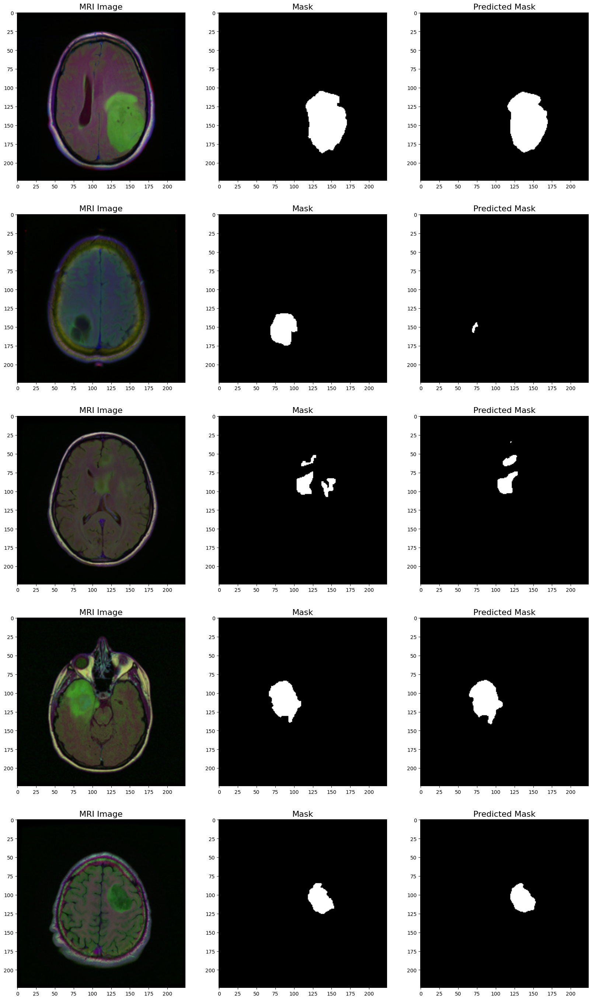

In [ ]:
view_multiple_predictions(sample_model, test_diagnosed_ds, count=5, color_map= 'rgb', fig_size=(20,38))

In [ ]:
def plot_training_curves(history, fig_size= (16,8), titile_size= 16):

  loss= np.array(history['loss'])
  val_loss= np.array(history['eval_loss'])
  dice_coef= np.array(history['loss_score'])
  eval_dice_coef= np.array(history['eval_score'])

  epochs= range(len(history['loss']))

  fig, (ax1, ax2)= plt.subplots(2, 1, figsize= fig_size)

  ax1.plot(epochs, loss, label= 'Training Loss', marker= 'o', color= 'C5');
  ax1.plot(epochs, val_loss, label= 'Validation Loss', marker= 'o', color= 'C6');

  #Filling area between losses
  ax1.fill_between(epochs, loss, val_loss, where= (loss > val_loss), color= 'C5', alpha= 0.4, interpolate= True);
  ax2.fill_between(epochs, loss, val_loss, where= (loss< val_loss), color= 'C6', alpha= 0.4, interpolate= True);


  # Adding formatting
  ax1.set_title('Loss - The Lower The Better', fontsize= 22);
  ax1.set_xlabel('Epochs', fontsize= 18);
  ax1.set_ylabel('Loss', fontsize= 18);
  ax1.tick_params(axis= 'both', which= 'major', labelsize= 14);
  ax1.legend(fontsize= 14)

  ax2.plot(epochs, dice_coef, label= 'Training Dice Score', marker= 'o', color= 'C5')
  ax2.plot(epochs, eval_dice_coef, label= 'Validation Dice Score', marker= 'o', color= 'C6')

  ax2.fill_between(epochs, dice_coef, eval_dice_coef, where= (dice_coef > eval_dice_coef), color= 'C5', alpha= 0.4, interpolate= True);
  ax2.fill_between(epochs, dice_coef, eval_dice_coef, where= (dice_coef < eval_dice_coef), color= 'C6', alpha= 0.4 , interpolate= True);

  ax2.set_title('Dice Score - The Higher The Better', fontsize= 22);
  ax2.set_xlabel('Epochs', fontsize= 18);
  ax2.set_ylabel('Dice Score', fontsize= 18);
  ax2.tick_params(axis= 'both', which= 'major', labelsize= 14);
  ax2.legend(fontsize= 14)

  sns.despine()

  return




In [ ]:
sample_df= pd.DataFrame(unet_session_history)

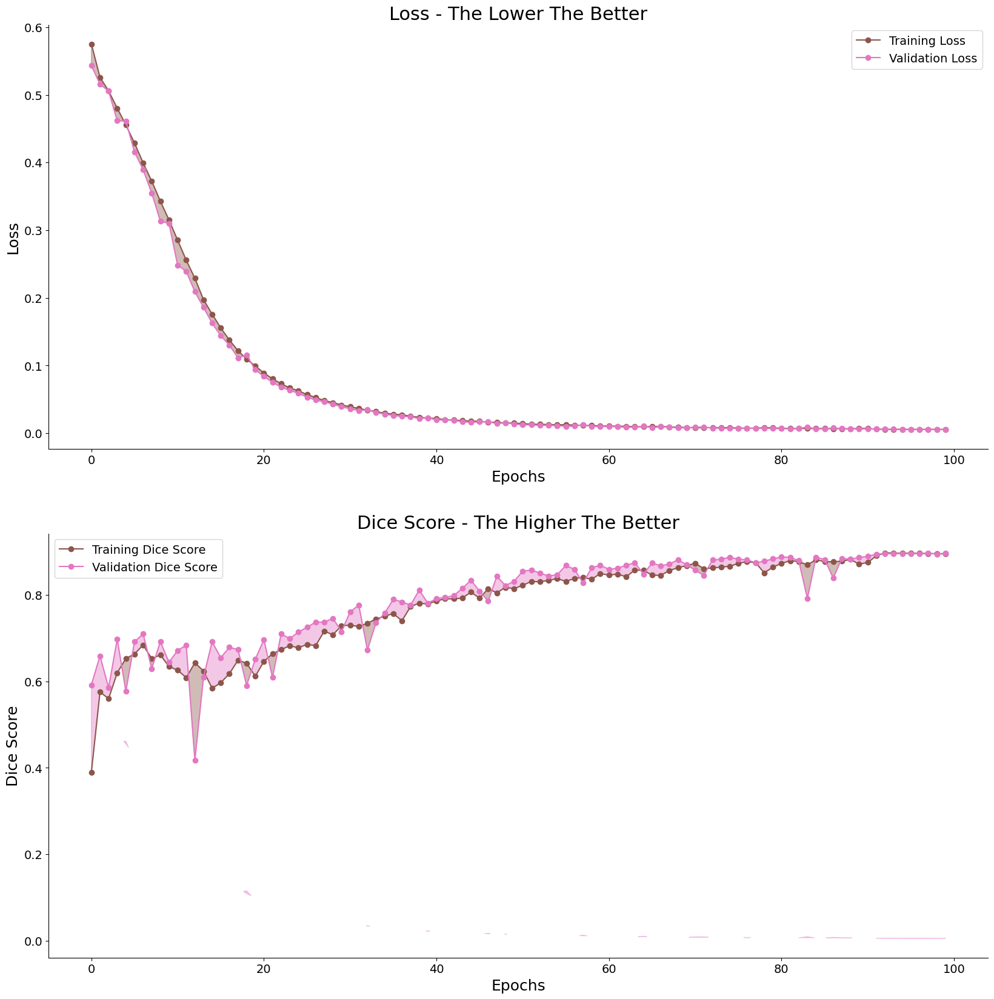

In [ ]:



plot_training_curves(unet_session_history, fig_size= (20, 20))

In [ ]:
def precision_(y_true, y_pred):
  intersection= (y_true * y_pred).sum()
  total_predicted_pixels= y_pred.sum()
  return (intersection/total_predicted_pixels).mean()

def recall_(y_true, y_pred):
  intersection= (y_true * y_pred).sum()
  total_true_pixels= y_true.sum()
  return (intersection/total_true_pixels).mean()

def dice_score(y_true, y_pred):
  eps= 1e-8
  intersection= (y_true * y_pred).sum()
  summation= (y_true + y_pred).sum()
  return ((2* intersection) / (summation + eps))

def jaccard_index(y_true, y_pred):
  eps= 1e-8
  intersection = (y_true * y_pred).sum()
  union= (y_true + y_pred).sum() - intersection
  return (intersection / (union+eps))


In [ ]:
def compute_metrics(
    model: nn.Module,
    sample_loader: torch.utils.data.DataLoader,
    device:torch.device
) -> np.ndarray:

  metrics= {
      'accuracy' : [],
      'precision': [],
      'recall' : [],
      'dice_score': [],
      'IoU': []
  }

  # Setting model into evaluation mode
  model.eval()

  with torch.inference_mode():

    for batch, (X, y) in enumerate(tqdm(sample_loader)):
      X= X.to(device)
      y= y.to(device)

      y_pred= model(X)

      predictions= torch.sigmoid(y_pred)
      predicted_class= (predictions > 0.3).float()

      # Computing Batch metrices for each mask
      for true_mask, pred_mask in zip(y, predicted_class):
        acc= ((true_mask == pred_mask ).sum() / torch.numel(true_mask)).cpu().item()
        prec= precision_(true_mask, pred_mask).cpu().item()
        rec= recall_(true_mask, pred_mask).cpu().item()
        dice= dice_score(true_mask, pred_mask).cpu().item()
        iou= jaccard_index(true_mask, pred_mask).cpu().item()

        metrics['accuracy'].append(acc)
        metrics['precision'].append(prec)
        metrics['recall'].append(rec)
        metrics['dice_score'].append(dice)
        metrics['IoU'].append(iou)

  return metrics













In [ ]:
unet_metrics= compute_metrics(sample_model, test_dl, DEVICE)

100%|██████████| 24/24 [00:05<00:00,  4.14it/s]


In [ ]:
# unet_metrics= compute_metrics(unet_model, test_dl, DEVICE)

In [ ]:
unet_test_df= test_df.copy()

unet_test_df= pd.concat((unet_test_df, pd.DataFrame(unet_metrics)), axis= 1)

#Generate Diagnosis Labels
unet_test_df['model_diagnosis']= [int(mask.max()) for mask in unet_test_masks]

unet_test_df

,id,patient,image_path,mask_path,diagnosis,accuracy,precision,recall,dice_score,IoU,model_diagnosis
0,22,TCGA_DU_A5TS_19970726,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,1,0.996313,0.683012,0.989848,0.808290,0.678261,1
1,11,TCGA_DU_8165_19970205,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0,1.000000,NaN,NaN,0.000000,0.000000,0
2,58,TCGA_HT_7881_19981015,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0,1.000000,NaN,NaN,0.000000,0.000000,0
3,19,TCGA_DU_5853_19950823,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0,1.000000,NaN,NaN,0.000000,0.000000,0
4,1,TCGA_DU_7298_19910324,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0,1.000000,NaN,NaN,0.000000,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...
762,29,TCGA_DU_6399_19830416,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,1,0.997848,0.838449,0.984820,0.905759,0.827751,1
763,4,TCGA_DU_7294_19890104,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0,1.000000,NaN,NaN,0.000000,0.000000,0
764,11,TCGA_HT_8105_19980826,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_H...,0,0.995217,0.000000,NaN,0.000000,0.000000,1
765,22,TCGA_DU_7014_19860618,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,1,0.995894,NaN,0.000000,0.000000,0.000000,0


In [ ]:
def generate_performance_scores(y_true, y_pred, log= True):
  model_accuracy= accuracy_score(y_true, y_pred)
  model_precision, model_recall, model_f1, _= (precision_recall_fscore_support(y_true, y_pred, average= 'weighted'))

  model_matthews_corrcoeff= matthews_corrcoef(y_true, y_pred)

  if log:
    print("===============================================")
    print(f'accuracy_score:\t\t{model_accuracy:.4f}\n')
    print("===============================================")
    print(f'precision_score:\t{model_precision:.4f}\n')
    print("===============================================")
    print(f'recall_score:\t\t{model_recall:.4f}\n')
    print("===============================================")
    print(f'f1_score:\t\t{model_f1:.4f}\n')
    print("===============================================")
    print(f'mathhews_corrcoef:\t{model_matthews_corrcoeff:.4f}\n')
    print("===============================================")

  performance_metrics= {
      'accuracy_score': model_accuracy,
      'precision_score': model_precision,
      'recall_score': model_recall,
      'f1_score':model_f1,
      'matthews_corrcoef':model_matthews_corrcoeff
  }
  return performance_metrics





In [ ]:
test_labels= unet_test_df['diagnosis'].to_numpy()

unet_predictions= unet_test_df['model_diagnosis'].to_numpy()

In [ ]:
generate_performance_scores(test_labels, unet_predictions, log= True )

accuracy_score:		0.9687

precision_score:	0.9687

recall_score:		0.9687

f1_score:		0.9687

mathhews_corrcoef:	0.9311



{'accuracy_score': 0.9687092568448501,
 'precision_score': 0.9686690866240777,
 'recall_score': 0.9687092568448501,
 'f1_score': 0.9686819506907108,
 'matthews_corrcoef': 0.93107206283239}